(-0.5, 719.5, 809.5, -0.5)

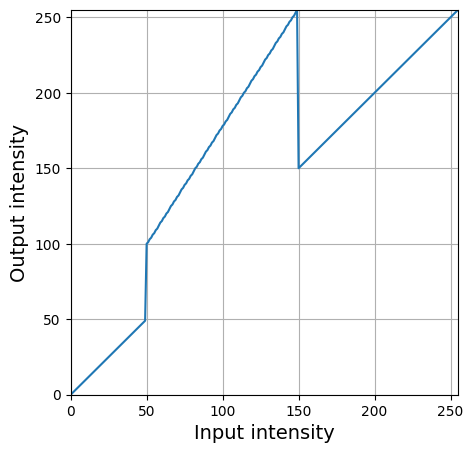

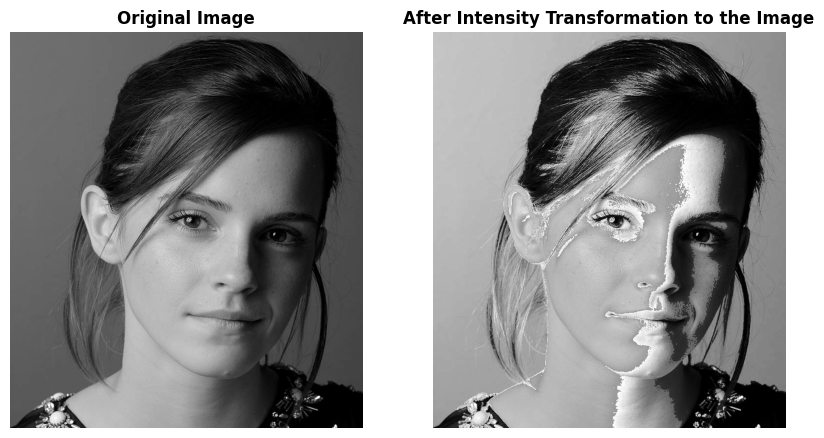

In [10]:
#q1
#intensity windowing 
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
# formation of transformation points
T1= np.linspace(0,49,50).astype('uint8')
T2= np.linspace(100,255,100).astype('uint8')
T3= np.linspace(150,255,106).astype('uint8')

# concatenate the points
transform = np.concatenate((T1,T2,T3),axis=0).astype("uint8")
assert len(transform) == 256
# plot the transformation
plt.figure(figsize = (5,5))
plt.plot(transform)
plt.grid('on')
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.xlabel('Input intensity', fontsize = 14)
plt.ylabel('Output intensity', fontsize = 14)

#open the image
im_o=cv.imread("images/emma.jpg", cv.IMREAD_GRAYSCALE)
assert im_o is not None
cv.namedWindow("image", cv.WINDOW_AUTOSIZE)
cv.imshow("image_original", im_o)
cv.waitKey(0)
cv.destroyAllWindows()

#apply the image transformation to the image
im_t = cv.LUT(im_o, transform)
cv.namedWindow("image", cv.WINDOW_AUTOSIZE)
cv.imshow("image", im_t)
cv.waitKey(0)
cv.destroyAllWindows()

# plt the images of the original and transformation
fig, ax = plt.subplots(1,2,figsize = (10,10))
ax[0].imshow(im_o, cmap= 'gray')
ax[0].set_title('Original Image',fontweight ="bold",fontsize = 12)
ax[0].axis('off')

ax[1].imshow(im_t , cmap= 'gray')
ax[1].set_title('After Intensity Transformation to the Image',fontweight ="bold",fontsize = 12)
ax[1].axis('off')


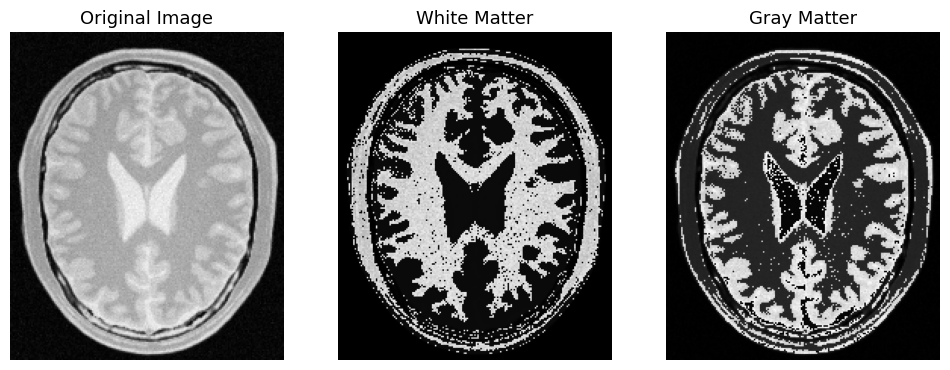

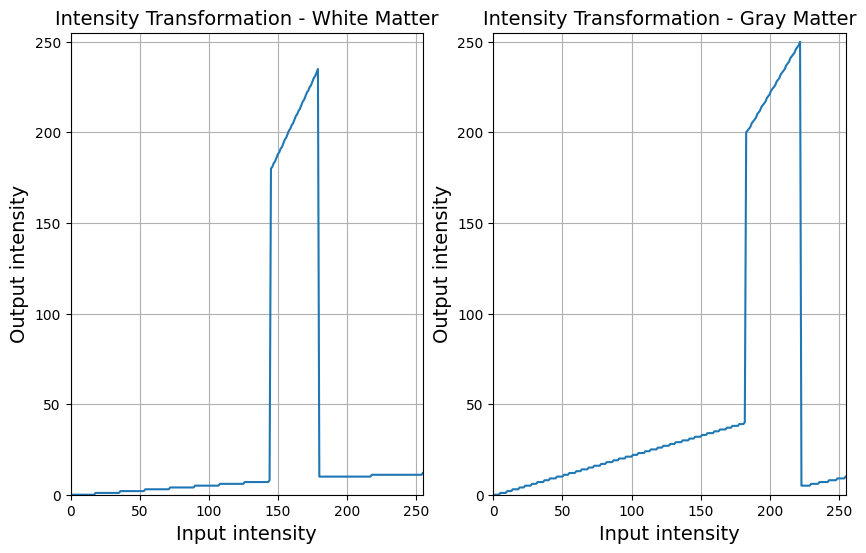

In [21]:
#q2
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

t1 = np.linspace(0,8,145).astype(np.uint8)
t2= np.linspace(180,235,35 ).astype(np.uint8)
t3 = np.linspace(10,12,76).astype(np.uint8)

t4 = np.linspace(0,40,183).astype(np.uint8)
t5 = np.linspace(200,250,40).astype(np.uint8)
t6 = np.linspace(5,10,33).astype(np.uint8)

t_w = np.concatenate((t1,t2,t3), axis =0).astype(np.uint8)
t_g = np.concatenate((t4,t5,t6), axis =0).astype(np.uint8)
assert len(t_g)==256
assert len(t_w) == 256

im_0 = cv.imread("images/BrainProtonDensitySlice9.png", cv.IMREAD_GRAYSCALE)
assert im_0 is not None
im_w = cv.LUT(im_0, t_w)
im_g = cv.LUT(im_0, t_g)

fig , ax =plt.subplots(1,3,figsize=(12,12))
ax[0].imshow(cv.cvtColor(im_0,cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image', fontsize = 13)
ax[0].axis('off')

ax[1].imshow(cv.cvtColor(im_w,cv.COLOR_BGR2RGB))
ax[1].set_title('White Matter', fontsize = 13)
ax[1].axis('off')

ax[2].imshow(cv.cvtColor(im_g,cv.COLOR_BGR2RGB))
ax[2].set_title('Gray Matter', fontsize = 13)
ax[2].axis('off')

fig , ax =plt.subplots(1,2,figsize=(10,6))
ax[0].plot(t_w)
ax[0].set_title('Intensity Transformation - White Matter', fontsize = 14)
ax[0].grid('on')
ax[0].set_xlim([0, 255])
ax[0].set_ylim([0, 255])
ax[0].set_xlabel('Input intensity', fontsize = 14)
ax[0].set_ylabel('Output intensity', fontsize = 14)

ax[1].plot(t_g)
ax[1].set_title('Intensity Transformation - Gray Matter', fontsize = 14)
ax[1].grid('on')
ax[1].set_xlim([0, 255])
ax[1].set_ylim([0, 255])
ax[1].set_xlabel('Input intensity', fontsize = 14)
ax[1].set_ylabel('Output intensity', fontsize = 14)
plt.show()

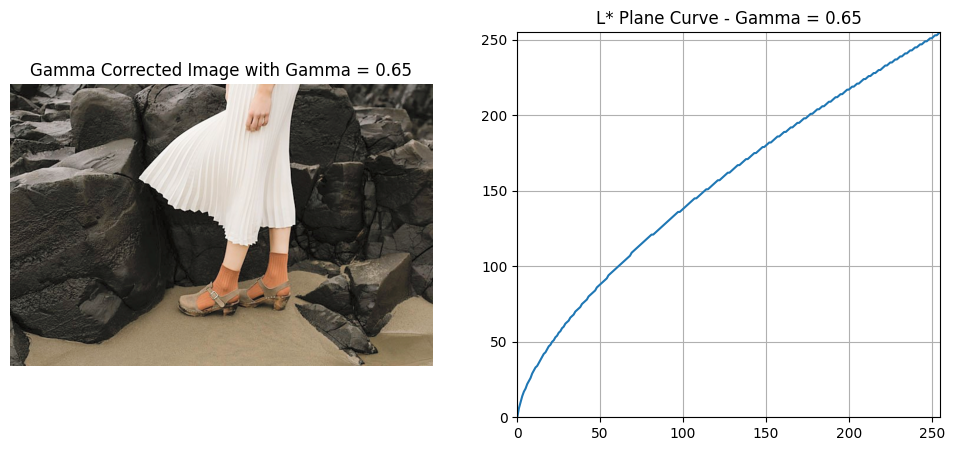

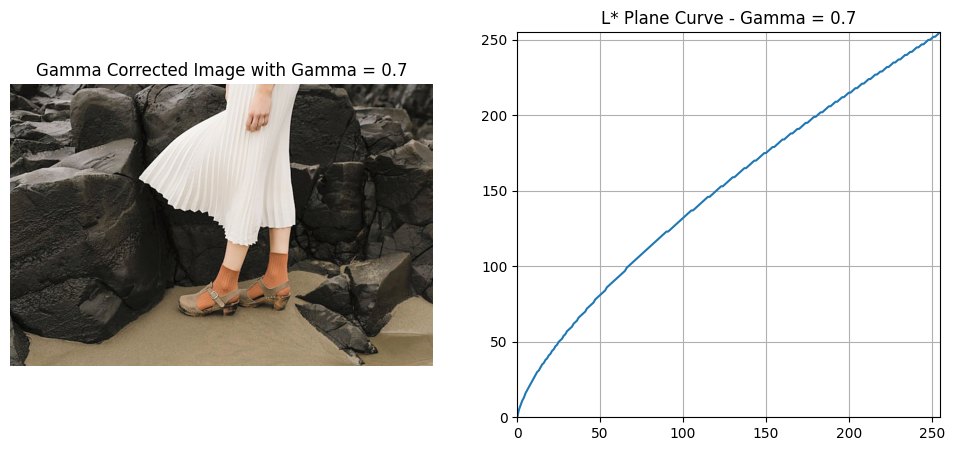

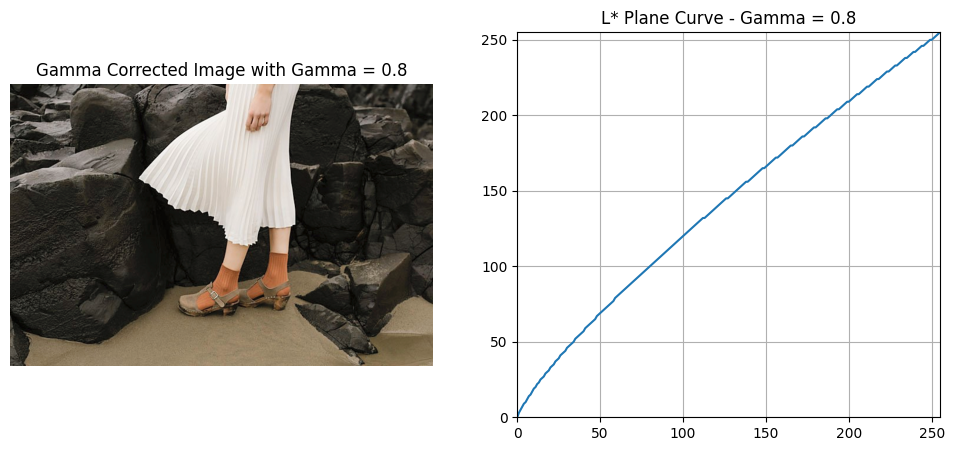

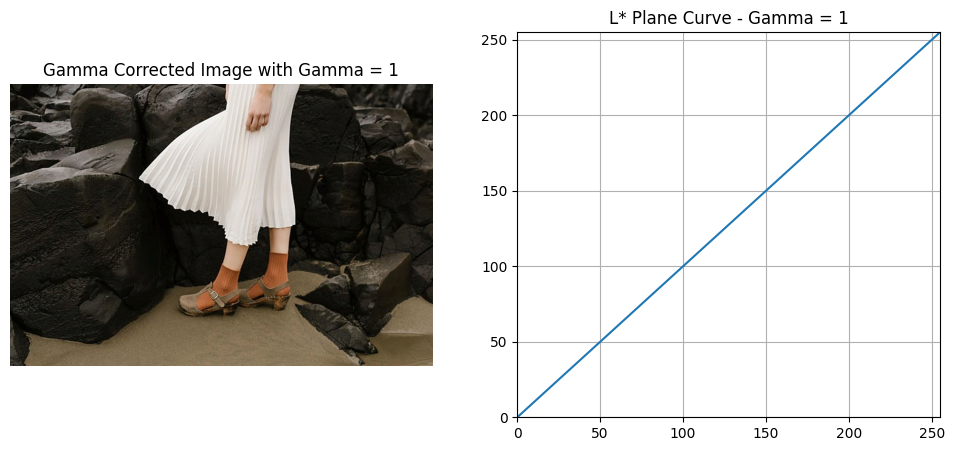

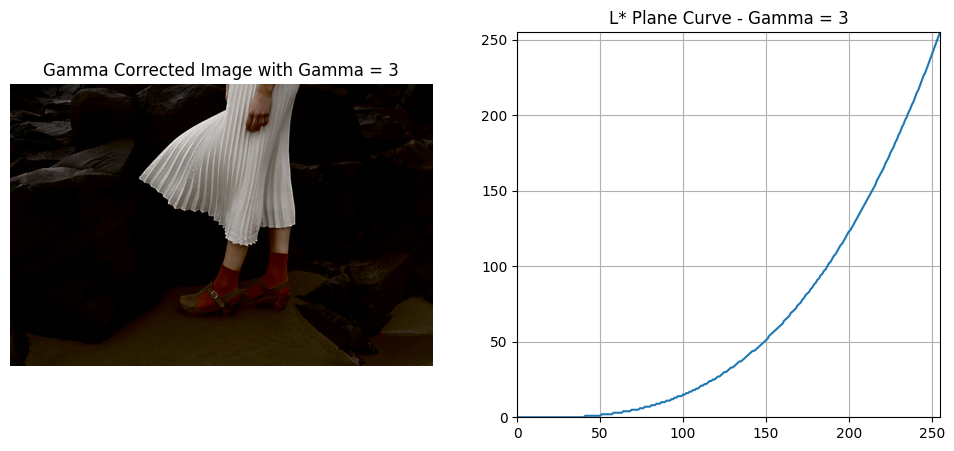

...

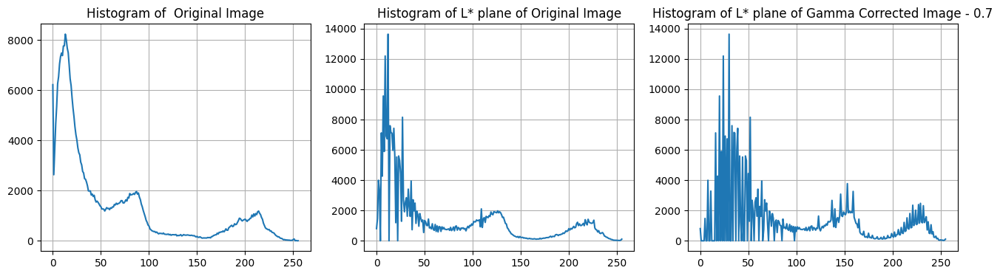

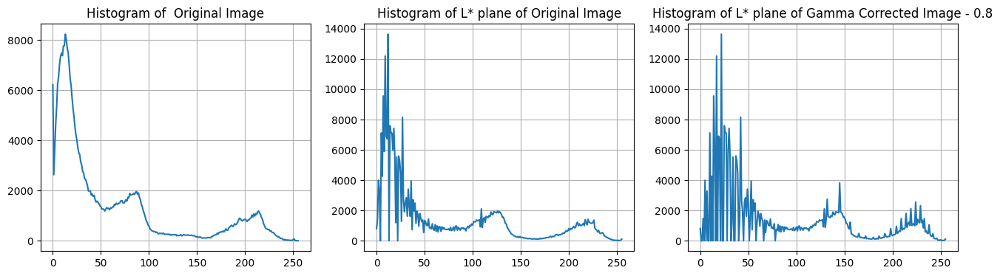

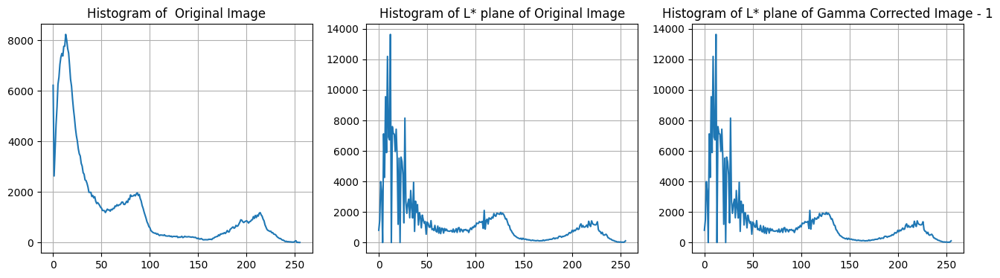

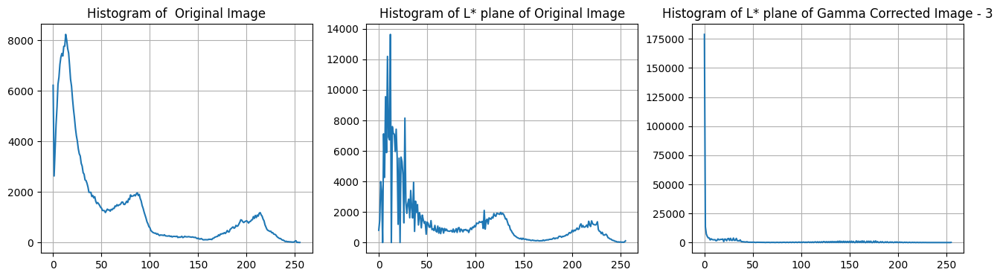

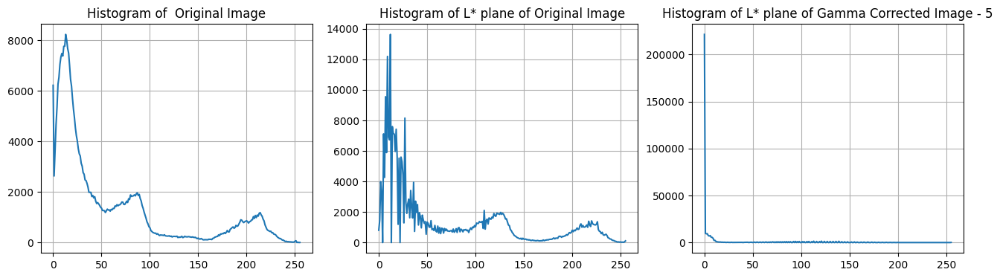

In [30]:
#q3
#plotting gamma graphs
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

gamma = [ 0.65, 0.7, 0.8, 1, 3,5]
im = cv.imread("images/highlights_and_shadows.jpg", cv.IMREAD_ANYCOLOR)
assert im is not None

lab_im= cv.cvtColor(im, cv.COLOR_BGR2Lab)
l,a,b = cv.split(lab_im)  #split into l,a,b plane

hist_l =[] # store values of l plane values in each gamma
for g in gamma:
    table= np.array([((i/255.0)**g*255.0) for i in range(0,256)]).astype(np.uint8)
    l_g = cv.LUT(l,table) # transformed l plane values
    gamma_im = cv.merge([l_g, a,b])
    hist_l.append(cv.calcHist([gamma_im], [0], None, [256], [0,256]))
    im_gc = cv.cvtColor(gamma_im, cv.COLOR_Lab2BGR)

    fig, ax = plt.subplots(1, 2, figsize = (12, 5))
    ax[0].imshow(cv.cvtColor(im_gc ,cv.COLOR_BGR2RGB))
    ax[0].set_title("Gamma Corrected Image with Gamma = " + str(g))
    ax[0].axis('off')

    ax[1].plot(table)
    ax[1].set_title("L* Plane Curve - Gamma = " + str(g))
    ax[1].set_xlim([0, 255])
    ax[1].set_ylim([0, 255])
    ax[1].grid("on")

#part b
for i in range(len(gamma)):
    hist = cv.calcHist([im],[0],None,[256],[0,256])
    hist1 = cv.calcHist([lab_im],[0],None,[256],[0,256])
    fig, ax = plt.subplots(1, 3, figsize=(16, 4))
    ax[0].plot(hist)
    ax[0].set_title("Histogram of  Original Image")
    ax[0].grid('on')

    ax[1].plot(hist1)
    ax[1].set_title("Histogram of L* plane of Original Image")
    ax[1].grid('on')

    ax[2].plot(hist_l[i])
    ax[2].set_title("Histogram of L* plane of Gamma Corrected Image - " + str(gamma[i]))
    ax[2].grid('on')

plt.show()

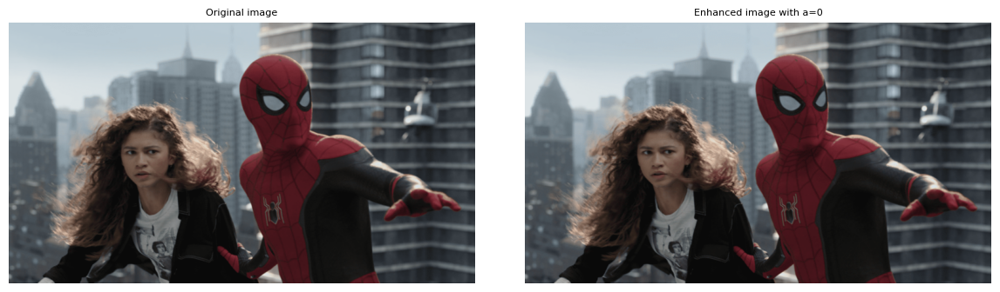

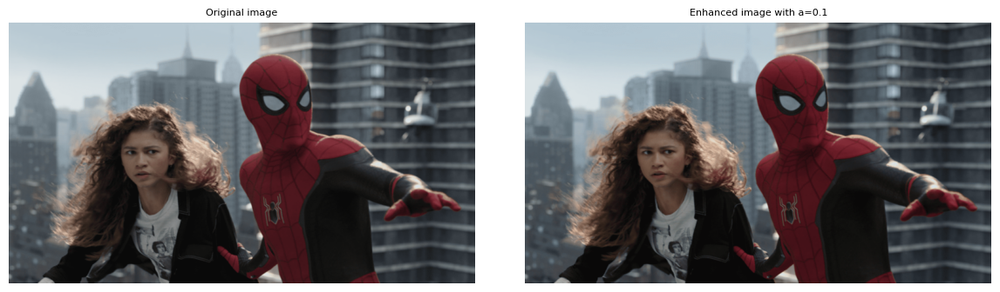

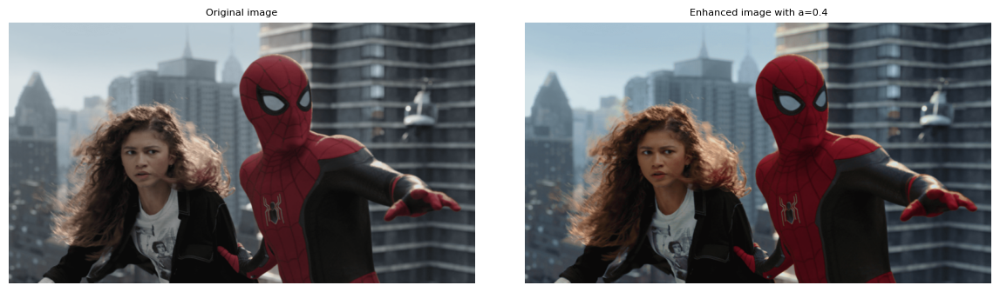

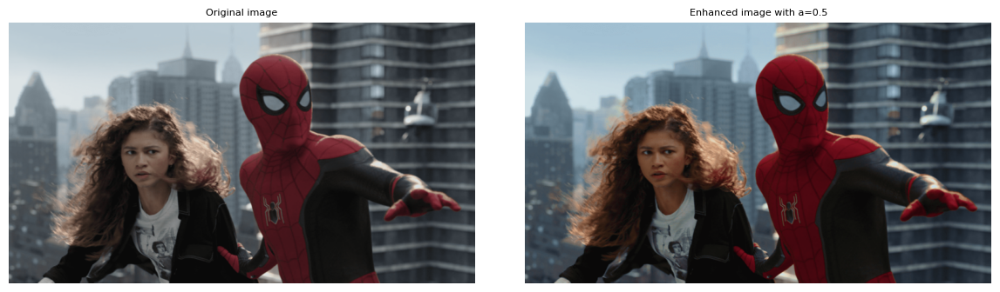

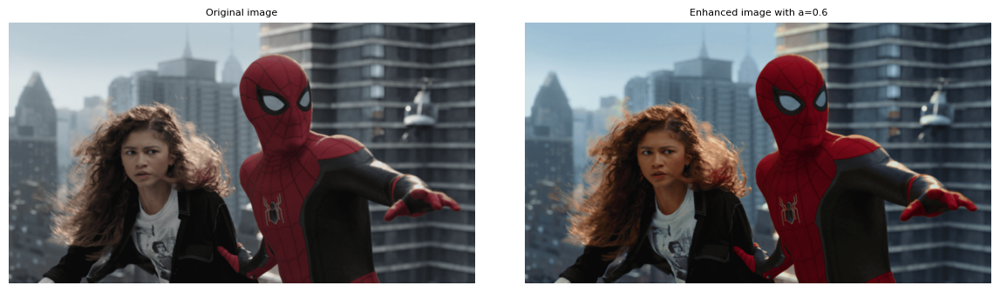

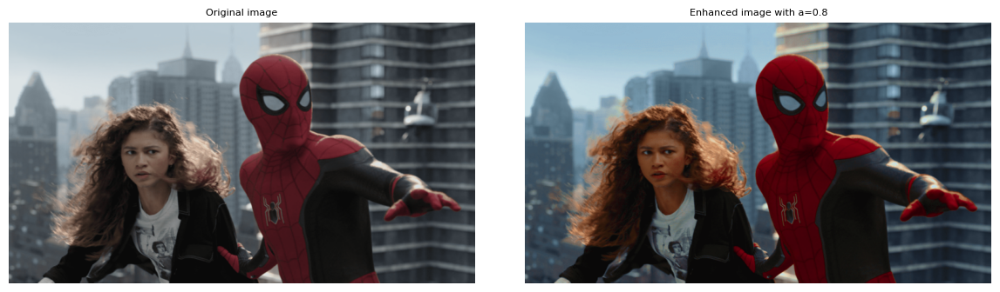

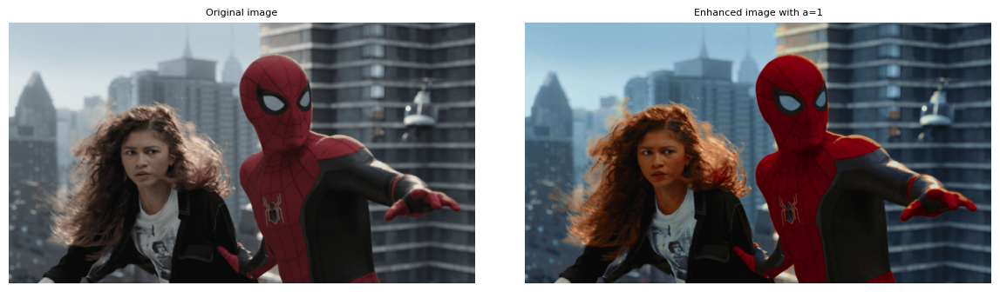

In [1]:
#q4
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import math

im = cv.imread('images/spider.png', cv.IMREAD_COLOR)
assert im is not None

img = cv.cvtColor(im, cv.COLOR_BGR2HSV)  # transform to hsv plane

h ,s,v = cv.split(img)         # split them into saturation , hue , value
it =np.zeros(256).astype(np.uint8)                   
ts =np.zeros_like(s)           # array to store value modifyfor saturation plane
ar = [0,.1,.4,.5,.6,0.8,1]
#apply transformation to the Saturation plane
for a in ar:
    for i in range(s.shape[0]):
        for j in range(s.shape[1]):
            x= s[i][j]

            sigma =70
            result = x + (a*128) * math.exp(-((x - 128)**2) / (2 * (sigma**2)))  # applying the transformation
            ts[i][j] = min(255,result)
    for x in range(256):
        result = x + (a*128) * math.exp(-((x - 128)**2) / (2 * (sigma**2)))  # applying the transformation
        it[x] = min(255,result)
    imgs = cv.merge([h,ts,v])       # enhanced image
    imgs = cv.cvtColor(imgs, cv.COLOR_HSV2BGR)
    f, ax = plt.subplots(1,2, figsize = (12,6))
    f.tight_layout()

    # ax[2].plot(it)
    # ax[2].set_title('Intensity Transformation',fontsize = 10)
    # ax[2].grid('on')
    # ax[2].set_xlim([0, 255])
    # ax[2].set_ylim([0, 255])
    # ax[2].set_xlabel('Input intensity',fontsize = 8)
    # ax[2].set_ylabel('Output intensity',fontsize = 8)   

    ax[1].imshow(cv.cvtColor(imgs,cv.COLOR_BGR2RGB))
    ax[1].set_title('Enhanced image with a='+str(a),fontsize = 8)
    ax[1].axis('off')

    ax[0].imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
    ax[0].set_title('Original image',fontsize = 8)
    ax[0].axis('off')
    plt.show()


    

250000
500


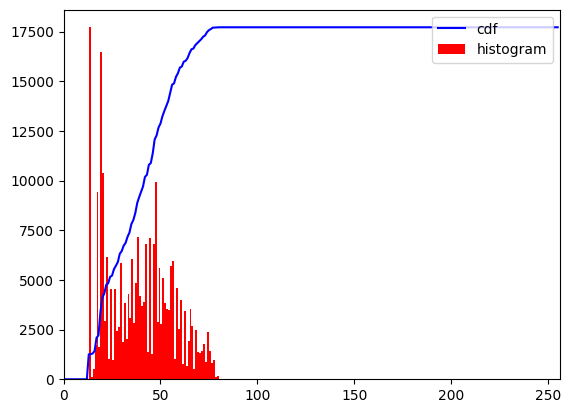

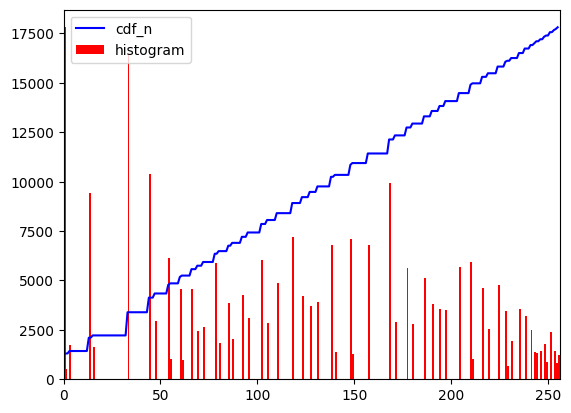

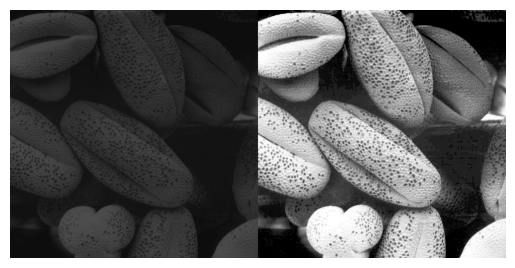

In [28]:
#q5
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt 
import cv2 as cv

im  = cv.imread('images/shells.tif', cv.IMREAD_GRAYSCALE)
assert im is not None

hist, bins = np.histogram(im.ravel(),256,[0,256])

cdf = hist.cumsum()

cdf_norm = cdf*hist.max()/cdf.max()
print(im.size)
print(im.shape[0])
plt.plot(cdf_norm, color='b')
plt.hist(im.flatten(),256, [ 0 , 256 ] , color = 'r' )
plt.xlim([0,256])
plt.legend(('cdf', 'histogram'), loc = 'upper right')
plt.show()

equ = cv.equalizeHist(im)
hist , bins =np.histogram(equ.ravel(),256,[0,256])
cdf_n = hist.cumsum()
cdf_normalized = cdf_n * hist.max()/cdf.max()
plt.plot(cdf_normalized, color='b')
plt.hist( equ.flatten(), 256 , [ 0 , 256 ] , color = 'r' )
plt.xlim([0,256])
plt.legend(('cdf_n', 'histogram'), loc = 'upper left')
plt.show()

res = np.hstack((im,equ))
plt.axis('off')
plt.imshow(res, cmap = 'gray')

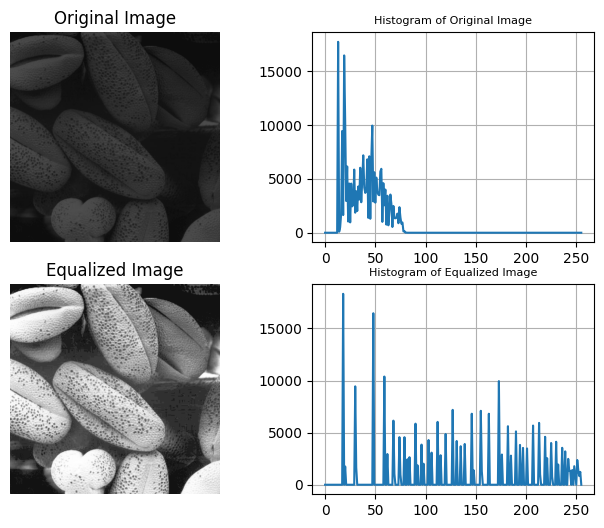

In [25]:
#q5
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt 
import cv2 as cv

imc  = cv.imread('images/shells.tif', cv.IMREAD_GRAYSCALE)
assert im is not None
im =imc.copy()
def plot_histogram(im,l=256):
    hist = np.zeros(l)
    for i in range(0, im.shape[0]):
    
        for j in range(0,im.shape[1]):
            pixel = im[i,j]
            hist[pixel] +=1           
    return (hist)

def histo_eq(img, l=256):          # function to do the histogram equalization and returnthe equalized image
    im = img.copy()
    k = (l-1)/im.size  # normalizing factor
    b= np.zeros(l)    # list for storing equalizied values
    for i in range(l):
        for j in range(i+1):
            b[i]+= his[j]*k
    #updating the new values to the img
    for i in range(im.shape[0]):
        for j in  range(im.shape[1]):
            tem =im[i,j]
            im[i,j]=b[tem]
    return im
his=plot_histogram(im)
imq  =histo_eq(im)
his2 = plot_histogram(imq)
f,a =plt.subplots(2,2, figsize =(8,6))
a[0,0].imshow( cv.cvtColor(im,cv.IMREAD_GRAYSCALE))
a[0,0].set_title('Original Image')
a[0,0].axis('off')

a[1,0].imshow( cv.cvtColor(imq,cv.IMREAD_GRAYSCALE))
a[1,0].set_title('Equalized Image')
a[1,0].axis('off')

a[0,1].plot(his)
a[0,1].set_title('Histogram of Original Image', fontsize= 8)
a[0,1].grid('on')

a[1,1].plot(his2)
a[1,1].set_title('Histogram of Equalized Image', fontsize=8)
a[1,1].grid('on')




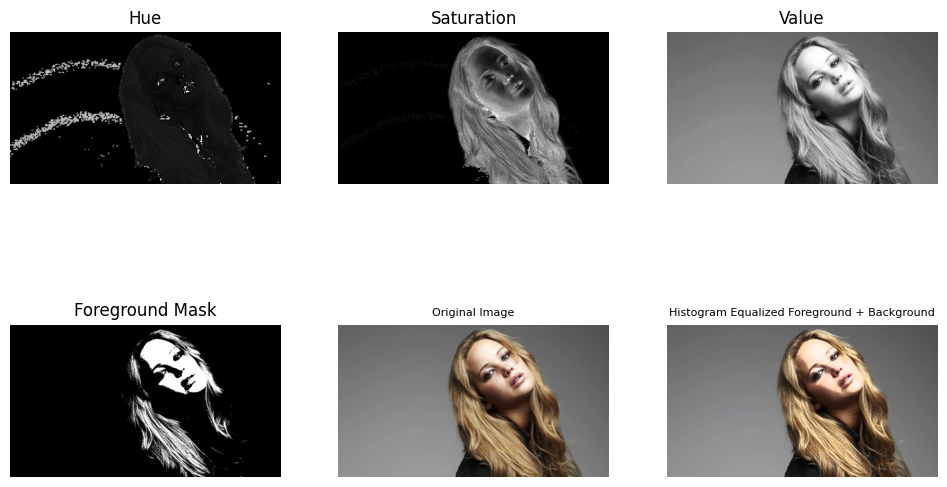

In [25]:
#q6

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

im6 = cv.imread('images/jeniffer.jpg',cv.IMREAD_ANYCOLOR)
imp =cv.cvtColor(im6, cv.COLOR_BGR2RGB)
img_n = cv.cvtColor(im6, cv.COLOR_BGR2HSV) # convert to HSV image
h,s,v = cv.split(img_n)           # split image into hue, saturation, value planes

# Choose an appropriate threshold value
threshold_value = 170
# thresholding to the value channel
ret, foreground_mask = cv.threshold(v, threshold_value, 230, cv.THRESH_BINARY)
# Obtain the foreground 
foreground = cv.bitwise_and(v, v, mask=foreground_mask)
# Calculate histogram equalization values
hist_foreground, _ = np.histogram(foreground, bins=256, range=(0, 256))
cumulative_sum = np.cumsum(hist_foreground)
equalized_values = ((cumulative_sum - cumulative_sum.min()) * 255) / (cumulative_sum.max() - cumulative_sum.min())
equalized_foreground = np.interp(foreground, np.arange(0, 256), equalized_values).astype(np.uint8)

# Extract background by inverting the foreground mask
background_mask = cv.bitwise_not(foreground_mask)
background = cv.bitwise_and(v, v, mask=background_mask)

result_value = cv.add(equalized_foreground, background)  
#merge the channels
result_hsv = cv.merge([h, s, result_value])

result_image = cv.cvtColor(result_hsv, cv.COLOR_HSV2BGR)
result_image = cv.cvtColor(result_image,cv.COLOR_BGR2RGB)

f, a = plt.subplots(2,3, figsize =(10,6))
f.tight_layout()

a[0,0].imshow(h, cmap='gray')
a[0,0].set_title('Hue')
a[0,0].axis('off')

a[0,1].imshow(s, cmap='gray')
a[0,1].set_title('Saturation')
a[0,1].axis('off')

a[0,2].imshow(v, cmap='gray')
a[0,2].set_title('Value')
a[0,2].axis('off')

a[1,0].imshow(foreground_mask,cmap='gray')
a[1,0].set_title('Foreground Mask')
a[1,0].axis('off')

a[1,2].imshow(result_image)
a[1,2].set_title('Histogram Equalized Foreground + Background', fontsize=8)
a[1,2].axis('off')

a[1,1].imshow(imp)
a[1,1].set_title('Original Image',fontsize=8)
a[1,1].axis('off')

plt.show()





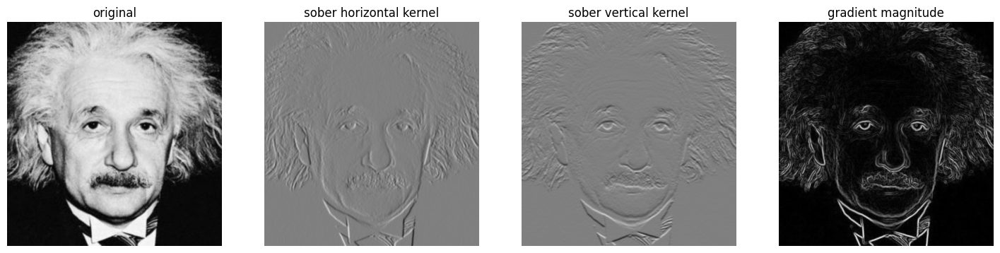

In [38]:
#q7
#sober horizontal kernel
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

im = cv.imread("images/einstein.png", cv.IMREAD_GRAYSCALE).astype(np.float32)
s_h = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype='float32')
s_v = np.array( [[-1,-2,-1],[0,0,0],[1,2,1]], dtype='float32')
f_h= cv.filter2D(im,-1, s_h)
f_v = cv.filter2D(im, -1,s_v )
grad_mag = np.sqrt(f_v**2+f_h**2)

f, a =plt.subplots(1,4,  figsize=(18,18))
a[0].imshow(im, cmap='gray',vmin=0,vmax=255)
a[0].set_title("original")
a[0].axis('off')

a[1].imshow(f_h, cmap= "gray",vmin=-1020,vmax=1020)
a[1].set_title("sober horizontal kernel")
a[1].axis('off')

a[2].imshow(f_v, cmap= 'gray',vmin=-1020,vmax=1020)
a[2].set_title("sober vertical kernel")
a[2].axis('off')

a[3].imshow(grad_mag, cmap= 'gray')
a[3].set_title("gradient magnitude")
a[3].axis('off')
plt.show()

#part b



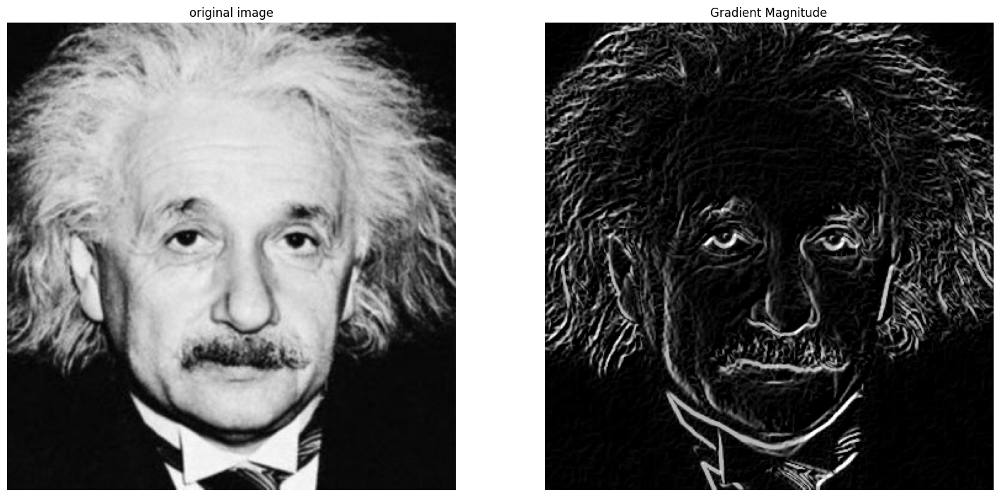

In [49]:
#q7
#sober horizontal kernel
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

imc = cv.imread("images/einstein.png", cv.IMREAD_GRAYSCALE).astype(np.float32)
im=imc.copy()
im2 = imc.copy()
s_h = np.array([(-1,0,1),(-2,0,2),(-1,0,1)], dtype='float32')
s_v = np.array( [(-1,-2,-1),(0,0,0),(1,2,1)], dtype='float32')
def filtering(im,s):
    rk, ck =s.shape
    conv =np.zeros_like(im)
    r, c =im.shape
    for i in range(1,r-int((rk-1)/2)):
        for j in range(1,c-int((ck-1)/2)):
            k=0
            for m in range(-1,2):
                for n in range(-1,2):
                    k += im[i+m,j+n]*s[1+m,1+n]
            if (k > 255.0):
                conv[i,j]=255.0
            elif (k<0.0):
                conv[i,j]=0.0
            else:
                conv[i,j]=k
    return conv

def filtering_pad(img,s):  #filtering with padding
    pad = s.shape[1] //2
    im = cv.copyMakeBorder(img,pad,pad,pad,pad,cv.BORDER_REPLICATE)
    rk, ck =s.shape
    conv =np.zeros_like(im)
    r, c =im.shape
    for i in range(1,r-pad):
        for j in range(1,c-pad):
            k=0
            for m in range(-1,2):
                for n in range(-1,2):
                    k += im[i+m,j+n]*s[1+m,1+n]
            if (k > 255.0):
                conv[i,j]=255.0
            elif (k<0.0):
                conv[i,j]=0.0
            else:
                conv[i,j]=k
    conv2 = conv[1:im.shape[0]-1, 1:im.shape[1]-1]
    assert (img.size == conv2.size)
    return conv2
def gradient_magnitude(im,f1=s_h,f2=s_v):
    f_h=filtering_pad(im,s_h)
    f_v=filtering_pad(im,s_v)
    gd = np.sqrt((f_h**2+f_v**2)/(1020/255))
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            gd[i,j] = gd[i,j]/1020*255
    return gd
gd1 = gradient_magnitude(im)
f, a =plt.subplots(1,2,  figsize=(18,18))
a[0].imshow(im, cmap='gray',vmin=0,vmax=255)
a[0].set_title("original image")
a[0].axis('off')

a[1].imshow(gd1, cmap= "gray")
a[1].set_title("Gradient Magnitude")
a[1].axis('off')

# f_h=filtering(im,s_h)
# f_v=filtering(im,s_v)

# f_h1=filtering_pad(im,s_h)
# f_v1=filtering_pad(im,s_v)
# gd2 = np.sqrt(f_h1**2+f_v1**2)
# a[0,0].imshow(im, cmap='gray',vmin=0,vmax=255)
# a[0,0].set_title("original")
# a[0,0].axis('off')

# a[0,1].imshow(f_h, cmap= "gray",vmin=-500,vmax=500)
# a[0,1].set_title("sober_h kernel using function")
# a[0,1].axis('off')

# a[0,2].imshow(f_v, cmap= 'gray',vmin=-500,vmax=500)
# a[0,2].set_title("sober_v kernel using function ")
# a[0,2].axis('off')

# a[0,3].imshow(gd1, cmap= 'gray')
# a[0,3].set_title("gradient magnitude ")
# a[0,3].axis('off')

# a[1,0].imshow(im, cmap='gray',vmin=0,vmax=255)
# a[1,0].set_title("original")
# a[1,0].axis('off')

# a[1,1].imshow(f_h1, cmap= "gray",vmin=0,vmax=255)
# a[1,1].set_title("sober_h kernel using function with padding")
# a[1,1].axis('off')

# a[1,2].imshow(f_v1, cmap= 'gray',vmin=0,vmax=255)
# a[1,2].set_title("sober_v kernel using function with padding ")
# a[1,2].axis('off')

# a[1,3].imshow(gd2, cmap= 'gray')
# a[1,3].set_title("gradient magnitude")
# a[1,3].axis('off')

plt.show()

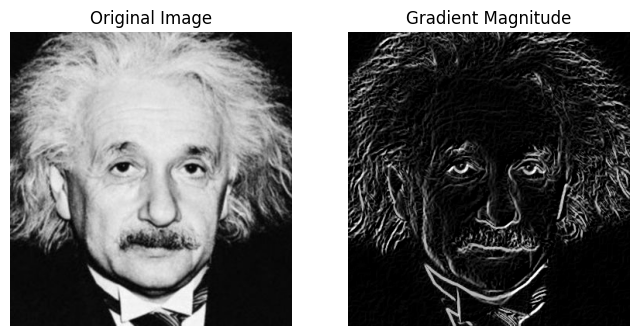

In [50]:
# using the property of filter

sob_h = np.multiply((np.array([[1],[2],[1]], dtype=np.int32)),(np.array([1,0,-1], dtype=np.int32)))
sob_v = sob_h.T

gd = gradient_magnitude(imc,sob_h,sob_v)
f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow( im, cmap='gray',vmin=0,vmax=255)
a[0].set_title('Original Image')
a[0].axis('off')

a[1].imshow( gd, cmap='gray')
a[1].set_title('Gradient Magnitude')
a[1].axis('off')
plt.show()
plt.



SSD for Nearest Neighbour Method is  569.8562596450618
SSD for Bilinear Interpolation Method is  600.7354205246913


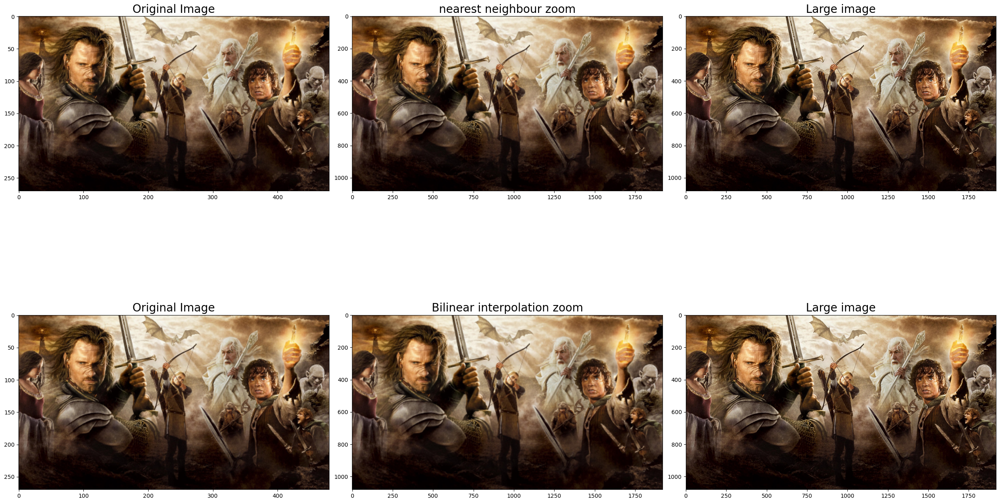

In [26]:
#q_8
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import math

#calculationg Normalized SSD
def n_ssd(im1, im2):
    h, w,c =im1.shape
    ssd = np.sum((im1.astype('float')-im2.astype('float'))**2)/(h*w)
    return ssd
    
# Function for nearest neighbour method
def z_nn(im, z=4):
    h, s, c = im.shape
    sm =np.zeros((h*z,s*z,c),dtype = np.uint8)
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            p = im[i][j]
            for k in range(i*z-1,i*z+z):
                for l in range(j*z-1,j*z+z):
                    sm[k][l]=p
    return sm

# function for Bilinear Interpolation
def bl_zoom(im, z=4):
    old_h, old_w, c = im.shape
    new_h = old_h*z
    new_w = old_w*z
    resized = np.zeros((new_h, new_w, c))
    w_scale_factor = (old_w) / (new_w) if( new_h !=0) else 0
    h_scale_factor = (old_h) / (new_h) if new_w!=0 else 0
    for i in range(new_h):
        for j in range(new_w):
            x = i * h_scale_factor
            y = j * w_scale_factor
            
            x_floor = math.floor(x)
            x_ceil = min(old_h - 1, math.ceil(x))
            y_floor = math.floor(y)
            y_ceil = min(old_w - 1, math.ceil(y))
            if (x_ceil == x_floor) and (y_ceil == y_floor):
                q = im[int(x), int(y), :]
                
            elif (x_ceil == x_floor):
                a = im[int(x), int(y_floor), :]
                b = im[int(x), int(y_ceil), :]
                q = a * (y_ceil - y) + b * (y - y_floor)
                
            elif (y_ceil == y_floor):
                a = im[int(x_floor), int(y), :]
                b = im[int(x_ceil), int(y), :]
                q = (a * (x_ceil - x)) + (b * (x - x_floor))
                
            else:
                m = im[x_floor, y_floor, :]
                n = im[x_ceil, y_floor, :]
                p = im[x_floor, y_ceil, :]
                r = im[x_ceil, y_ceil, :]

                a = m * (x_ceil - x) + n * (x - x_floor)
                b = p * (x_ceil - x) + r * (x - x_floor)
                q = a * (y_ceil - y) + b * (y - y_floor) 
           
            resized[i,j,:] = q
            
    return resized.astype(np.uint8)

img = cv.imread('images/zooming/im01small.png').astype('uint8')
assert img is not None

img_z = z_nn(img)
img_bl = bl_zoom(img)
im_l = cv.imread('images/zooming/im01.png').astype('uint8')
print('SSD for Nearest Neighbour Method is ', n_ssd(img_z, im_l))
print('SSD for Bilinear Interpolation Method is ', n_ssd(img_bl, im_l))


f, a = plt.subplots(2,3,figsize=(25,15))
f.tight_layout()
#plotting
a[0,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[0,0].set_title('Original Image',fontsize=20)

a[0,1].imshow(cv.cvtColor(img_z, cv.COLOR_BGR2RGB))
a[0,1].set_title('nearest neighbour zoom',fontsize=20)

a[1,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[1,0].set_title('Original Image',fontsize=20)

a[1,1].imshow(cv.cvtColor(img_bl, cv.COLOR_BGR2RGB))
a[1,1].set_title('Bilinear interpolation zoom',fontsize=20)

a[0,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[0,2].set_title('Large image',fontsize=20)
a[1,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[1,2].set_title('Large image',fontsize=20)

plt.show()

SSD for Nearest Neighbour Method is  131.18710720486112
SSD for Bilinear Interpolation Method is  146.88199652777777


Text(0.5, 1.0, 'Large image')

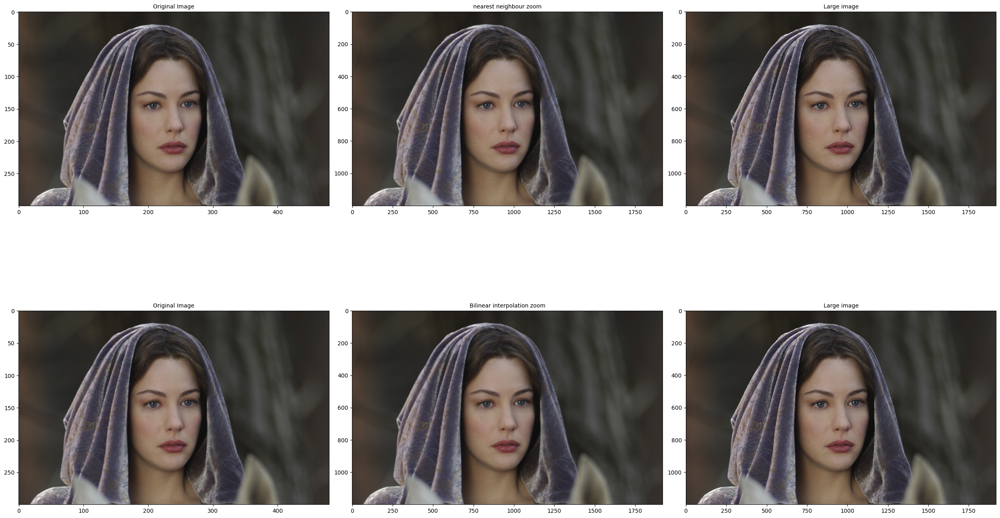

In [27]:
img = cv.imread('images/zooming/im02small.png').astype('uint8')
assert img is not None

img_z = z_nn(img)
img_bl = bl_zoom(img)
im_l = cv.imread('images/zooming/im02.png').astype('uint8')
print('SSD for Nearest Neighbour Method is ', n_ssd(img_z, im_l))
print('SSD for Bilinear Interpolation Method is ', n_ssd(img_bl, im_l))


f, a = plt.subplots(2,3,figsize=(25,15))
f.tight_layout()
#plotting
a[0,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[0,0].set_title('Original Image',fontsize=10)

a[0,1].imshow(cv.cvtColor(img_z, cv.COLOR_BGR2RGB))
a[0,1].set_title('nearest neighbour zoom',fontsize=10)

a[1,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[1,0].set_title('Original Image',fontsize=10)

a[1,1].imshow(cv.cvtColor(img_bl, cv.COLOR_BGR2RGB))
a[1,1].set_title('Bilinear interpolation zoom',fontsize=10)

a[0,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[0,2].set_title('Large image',fontsize=10)
a[1,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[1,2].set_title('Large image',fontsize=10)

In [ ]:
img = cv.imread('images/zooming/im03small.png').astype('uint8')
assert img is not None

img_z = z_nn(img)
img_bl = bl_zoom(img)
im_l = cv.imread('images/zooming/im03.png').astype('uint8')
print('SSD for Nearest Neighbour Method is ', n_ssd(img_z, im_l))
print('SSD for Bilinear Interpolation Method is ', n_ssd(img_bl, im_l))


f, a = plt.subplots(2,3,figsize=(25,15))
f.tight_layout()
#plotting
a[0,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[0,0].set_title('Original Image',fontsize=10)

a[0,1].imshow(cv.cvtColor(img_z, cv.COLOR_BGR2RGB))
a[0,1].set_title('nearest neighbour zoom',fontsize=10)

a[1,0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
a[1,0].set_title('Original Image',fontsize=10)

a[1,1].imshow(cv.cvtColor(img_bl, cv.COLOR_BGR2RGB))
a[1,1].set_title('Bilinear interpolation zoom',fontsize=10)

a[0,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[0,2].set_title('Large image',fontsize=10)
a[1,2].imshow(cv.cvtColor(im_l, cv.COLOR_BGR2RGB))
a[1,2].set_title('Large image',fontsize=10)

In [ ]:
#q_9
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

im = cv.imread('images/flower.png', cv.IMREAD_COLOR)
im_original = im.copy()

mask = np.zeros(im.shape[:2], np.uint8)
h,w, c = im_original.shape
rect = (0, 0, h, w)
fgdModel = np.zeros((1, 65), np.float64)
bgdModel = np.zeros((1, 65), np.float64)

cv.grabCut(im, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

f_mask = np.where((mask==0) | (mask==2), 0, 1).astype("uint8")
im_fgd = im*f_mask[:, :, np.newaxis]
b_mask = np.where((mask==1) | (mask==3), 0, 1).astype("uint8")
im_bgd = im*b_mask[:, :, np.newaxis]

cv.imshow('Image', im_bgd)
cv.waitKey(0)
cv.destroyAllWindows()

fig, ax = plt.subplots(1, 4, figsize=(16, 5))

ax[0].imshow(cv.cvtColor(im_original, cv.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(f_mask, cmap = "gray")
ax[1].set_title("Mask")
ax[1].axis("off")

ax[2].imshow(cv.cvtColor(im_fgd, cv.COLOR_BGR2RGB))
ax[2].set_title("Foreground Image")
ax[2].axis("off")

ax[3].imshow(cv.cvtColor(im_bgd, cv.COLOR_BGR2RGB))
ax[3].set_title("Background Image")
ax[3].axis("off")

plt.show()

In [ ]:
im_blurred = cv.blur(im_bgd, (15, 15))
im_enhanced = cv.add(im_blurred, im_fgd)

fig, ax = plt.subplots(1, 2, figsize=(9, 6))

ax[0].imshow(cv.cvtColor(im_original, cv.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv.cvtColor(im_enhanced, cv.COLOR_BGR2RGB))
ax[1].set_title("Enhanced Image")
ax[1].axis("off")

plt.show()